In [71]:
import os
import pandas as pd
import geopandas as gpd

import sys
sys.path.insert(0, "../utils/")
import visual_utils

import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

cwd = os.path.dirname(os.getcwd())
%load_ext autoreload
%autoreload 2

## Inspect Satellite Images

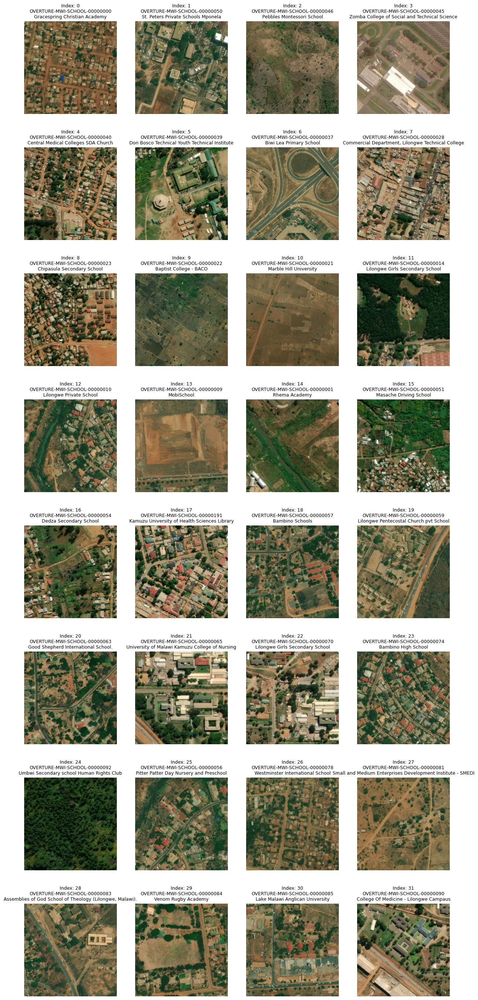

In [74]:
iso = "MWI"
image_dir = os.path.join(cwd, f"data/images/512x512_60cm/")
school_filename = os.path.join(cwd, f"data/vectors/school/clean/{iso}_clean.geojson")
visual_utils.inspect_images(school_filename, image_dir, iso, index=0, category="SCHOOL")

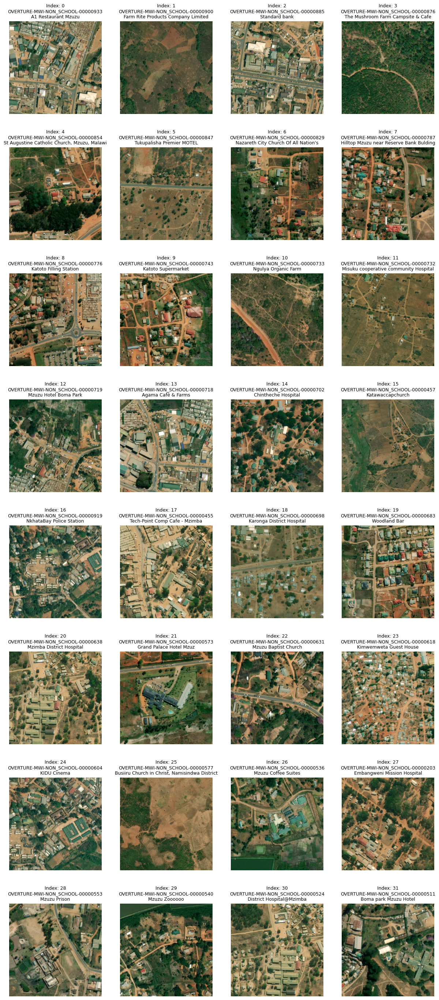

In [20]:
image_dir = os.path.join(cwd, f"data/images/512x512_60cm/")
nonschool_filename = os.path.join(cwd, f"data/vectors/non_school/clean/{iso}_clean.geojson")
clean_utils.inspect_images(nonschool_filename, image_dir, iso, index=0, category="NON_SCHOOL")

In [25]:
index = 24
clean_utils.map_coords(nonschool_filename, index)

## Google Earth Engine

In [1]:
import ee
import eeconvert as eec
import geemap as emap

ee.Authenticate() 
ee.Initialize()

Enter verification code:  4/1AfJohXmteE9HBOoHMTuTU4DnX2ZQUGE03IpJQNA3TF_0gagNWHiJHfYvZZ8



Successfully saved authorization token.


In [2]:
import xarray as xr
import wxee
import sys
sys.path.insert(0, "../utils/")
import data_utils

<Axes: >

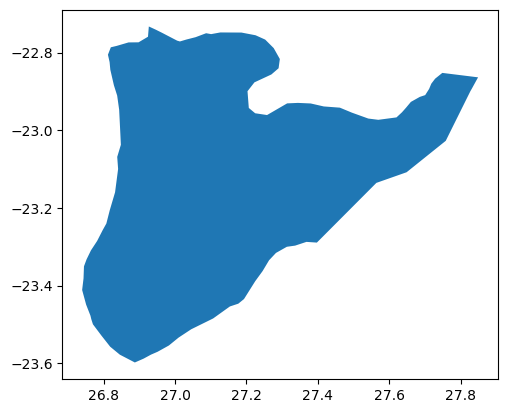

In [25]:
geoboundary =  data_utils._get_geoboundaries(iso, adm_level="ADM2")
geoboundary.iloc[[1]].plot()

In [69]:
import os
import geopandas as gpd
cwd = os.path.dirname(os.getcwd())
school_filename = os.path.join(cwd, f"data/vectors/school/clean/{iso}_clean.geojson")
data = gpd.read_file(school_filename).iloc[[0]]
data = data.to_crs("EPSG:3857")
data['geometry'] = data['geometry'].centroid
data['geometry'] = data['geometry'].buffer(500)
data = data.to_crs("EPSG:4326")
geometry = eec.gdfToFc(data) 
image = ee.Image("JRC/GHSL/P2023A/GHS_BUILT_C/2018").select(
    'built_characteristics'
).clip(geometry)

In [70]:
file = image.wx.to_tif(
    out_dir='./', 
    description="example", 
    region=geometry.geometry(), 
    scale=10, 
    crs="EPSG:4326"
)
file

Downloading:   0%|          | 0.00/3.33k [00:00<?, ?iB/s]

['./example.time.20180101T000000.tif']